In [5]:
from tensorflow.keras.preprocessing import image as kp_image
from tensorflow.keras.applications.vgg19 import preprocess_input
import numpy as np

def load_and_process_img(path_to_img, target_size=(224, 224)):
    img = kp_image.load_img(path_to_img, target_size=target_size)
    img = kp_image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

content_image = load_and_process_img('/content/is.jpeg', target_size=(224, 224))
style_image = load_and_process_img('/content/is1.webp', target_size=(224, 224))


In [6]:
def compute_content_loss(base_content, target):
    base_content = tf.image.resize(base_content, [target.shape[1], target.shape[2]])  # Resize base_content to match target
    return tf.reduce_mean(tf.square(base_content - target))


Iteration: 0, Loss: 0.0
Iteration: 5, Loss: 367885312.0
Iteration: 10, Loss: 366732896.0
Iteration: 15, Loss: 366150336.0
Iteration: 20, Loss: 365813024.0
Iteration: 25, Loss: 365631168.0
Iteration: 30, Loss: 365478592.0
Iteration: 35, Loss: 365365440.0
Iteration: 40, Loss: 365274880.0
Iteration: 45, Loss: 365234176.0
Iteration: 50, Loss: 365180064.0
Iteration: 55, Loss: 365111776.0
Iteration: 60, Loss: 365081312.0
Iteration: 65, Loss: 365060832.0
Iteration: 70, Loss: 365005632.0
Iteration: 75, Loss: 364981472.0
Iteration: 80, Loss: 364940832.0
Iteration: 85, Loss: 364920512.0
Iteration: 90, Loss: 364894208.0
Iteration: 95, Loss: 364891232.0
Iteration: 100, Loss: 364863680.0
Iteration: 105, Loss: 364846272.0
Iteration: 110, Loss: 364860544.0
Iteration: 115, Loss: 364853216.0
Iteration: 120, Loss: 364835936.0
Iteration: 125, Loss: 364803808.0
Iteration: 130, Loss: 364790496.0
Iteration: 135, Loss: 364765760.0
Iteration: 140, Loss: 364750976.0
Iteration: 145, Loss: 364720736.0
Iteration:

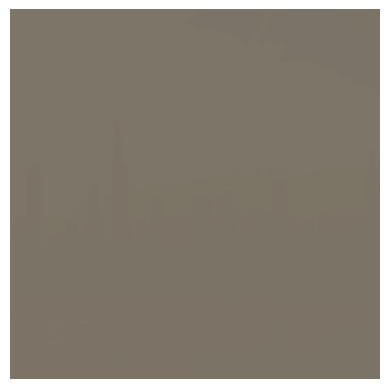

In [2]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.preprocessing import image as kp_image
from tensorflow.keras.applications.vgg19 import preprocess_input
import numpy as np
import matplotlib.pyplot as plt

# Load and process image
def load_and_process_img(path_to_img, target_size=(224, 224)):
    img = kp_image.load_img(path_to_img, target_size=target_size)
    img = kp_image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

# Deprocess image for visualization
def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Compute content loss
def compute_content_loss(base_content, target):
    base_content = tf.image.resize(base_content, [target.shape[1], target.shape[2]])  # Resize to match target
    return tf.reduce_mean(tf.square(base_content - target))

# Compute gram matrix (used for style loss)
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / num_locations

# Compute style loss
def compute_style_loss(base_style, gram_target):
    # Get the dimensions from the tensor shape
    _, height, width, channels = base_style.get_shape().as_list()  # Include the batch dimension
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))


# Combine content and style losses
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    style_weight, content_weight = loss_weights
    model_outputs = model(init_image)

    # Get the content and style feature representations
    content_output = model_outputs[len(style_layers):]
    style_output = model_outputs[:len(style_layers)]

    # Compute style loss
    style_score = 0
    for target_style, comb_style in zip(gram_style_features, style_output):
        style_score += compute_style_loss(comb_style, target_style)
    style_score *= style_weight / len(style_layers)

    # Compute content loss
    content_score = 0
    for target_content, comb_content in zip(content_features, content_output):
        content_score += compute_content_loss(comb_content, target_content)
    content_score *= content_weight / len(content_layers)

    # Total loss
    total_loss = style_score + content_score
    return total_loss

# Compute gradients
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    return tape.gradient(loss, init_image), loss

# Set style and content layers for VGG19
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
content_layers = ['block5_conv2']
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

# Load the VGG19 model
def get_model():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    style_outputs = [vgg.get_layer(name).output for name in style_layers]
    content_outputs = [vgg.get_layer(name).output for name in content_layers]
    model_outputs = style_outputs + content_outputs
    return tf.keras.Model(vgg.input, model_outputs)

# Extract content and style features
def get_content_and_style_features(model, content_path, style_path):
    content_image = load_and_process_img(content_path)
    style_image = load_and_process_img(style_path)

    content_outputs = model(content_image)
    style_outputs = model(style_image)

    style_features = [style_layer for style_layer in content_outputs[:len(style_layers)]]
    content_features = [content_layer for content_layer in content_outputs[len(style_layers):]]

    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    return gram_style_features, content_features

# Neural Style Transfer function
def neural_style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e3, style_weight=1e-2):
    # Load the model
    model = get_model()

    # Extract features
    gram_style_features, content_features = get_content_and_style_features(model, content_path, style_path)

    # Initialize generated image as a copy of the content image
    init_image = load_and_process_img(content_path)
    init_image = tf.Variable(init_image, dtype=tf.float32)

    # Optimizer
    optimizer = tf.optimizers.Adam(learning_rate=5.0)

    # Set the loss weights
    loss_weights = (style_weight, content_weight)

    # Run the style transfer optimization loop
    best_loss, best_img = float('inf'), None
    display_interval = num_iterations // 100

    for i in range(num_iterations):
        grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
        optimizer.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -1.0, 1.0)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = init_image.numpy()

        if i % display_interval == 0:
            print(f"Iteration: {i}, Loss: {loss}")

    return deprocess_img(best_img)

# Plot the result
def show_results(best_img):
    plt.imshow(best_img)
    plt.axis('off')
    plt.show()

# Example usage (adjust the paths accordingly)
content_image_path = '/content/is.jpeg'
style_image_path = '/content/is1.webp'

best_img = neural_style_transfer(content_image_path, style_image_path, num_iterations=500)
show_results(best_img)


Iteration 0, Loss: 4369368064.0
Iteration 50, Loss: 4266927872.0
Iteration 100, Loss: 4161170176.0
Iteration 150, Loss: 4053856768.0
Iteration 200, Loss: 3945756672.0
Iteration 250, Loss: 3836017920.0
Iteration 300, Loss: 3724449280.0
Iteration 350, Loss: 3611279616.0
Iteration 400, Loss: 3496792320.0
Iteration 450, Loss: 3381639168.0


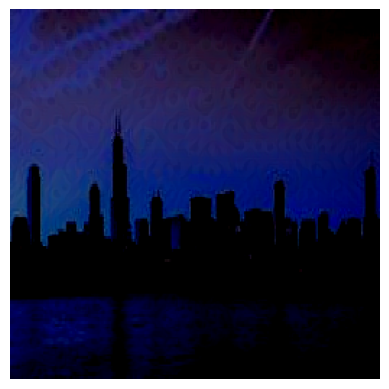

In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG19
from tensorflow.keras.preprocessing import image as keras_image

# Load and preprocess the images
def load_and_process_image(img_path):
    img = keras_image.load_img(img_path, target_size=(256, 256))  # Resize for efficiency
    img = keras_image.img_to_array(img)  # Convert to array
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = tf.keras.applications.vgg19.preprocess_input(img)  # Preprocess for VGG19
    return img

# Load the content and style images
content_image_path = '/content/is.jpeg'  # Path to your content image
style_image_path = '/content/is1.webp'  # Path to your style image

content_image = load_and_process_image(content_image_path)
style_image = load_and_process_image(style_image_path)

# Define a function to compute the Gram matrix
def gram_matrix(tensor):
    channels = int(tensor.shape[-1])  # Get number of channels
    a = tf.reshape(tensor, [-1, channels])  # Reshape to (height*width, channels)
    gram = tf.matmul(a, a, transpose_a=True)  # Compute the gram matrix
    return gram / tf.cast(tf.shape(a)[0], tf.float32)  # Normalize

# Load the VGG19 model
def get_model():
    vgg = VGG19(weights='imagenet', include_top=False)  # Load model
    vgg.trainable = False  # Freeze the model
    return vgg

# Define content and style layers
content_layers = ['block5_conv2']  # Layer used for content
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']  # Layers for style

# Get the outputs for the specified layers
def get_layer_outputs(model, content_layers, style_layers):
    outputs = []
    for layer in model.layers:
        if layer.name in content_layers or layer.name in style_layers:
            outputs.append(layer.output)
    return outputs

# Create the combined model for feature extraction
def get_feature_extractor(model):
    outputs = get_layer_outputs(model, content_layers, style_layers)
    return tf.keras.Model(inputs=model.inputs, outputs=outputs)

# Compute the content and style features
def get_features(model, content_image, style_image):
    content_outputs = model(content_image)
    style_outputs = model(style_image)

    content_features = [content_outputs[0]]  # Get content features
    style_features = [gram_matrix(style) for style in style_outputs[1:]]  # Compute Gram matrices for style

    return content_features, style_features

# Compute content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

# Compute style loss
def compute_style_loss(base_style, gram_target):
    _, height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

# Compute total loss
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)

    content_output = model_outputs[0]
    style_outputs = model_outputs[1:]

    content_loss = compute_content_loss(content_output, content_features[0])

    style_loss = 0
    for target, output in zip(gram_style_features, style_outputs):
        style_loss += compute_style_loss(output, target)

    total_loss = loss_weights[0] * content_loss + loss_weights[1] * style_loss
    return total_loss

# Gradient computation function
@tf.function
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Function for neural style transfer
def neural_style_transfer(content_image_path, style_image_path, num_iterations=500):
    model = get_model()
    feature_extractor = get_feature_extractor(model)

    content_features, gram_style_features = get_features(feature_extractor,
                                                          load_and_process_image(content_image_path),
                                                          load_and_process_image(style_image_path))

    init_image = tf.Variable(load_and_process_image(content_image_path), dtype=tf.float32)

    # Define loss weights
    loss_weights = (1e3, 1e-2)  # Content weight, Style weight
    optimizer = tf.keras.optimizers.Adam(learning_rate=5e-3)  # Use float for learning rate

    # Style transfer loop
    for i in range(num_iterations):
        grads, loss = compute_grads(feature_extractor, loss_weights, init_image, gram_style_features, content_features)
        optimizer.apply_gradients([(grads, init_image)])

        if i % 50 == 0:
            print(f"Iteration {i}, Loss: {loss.numpy()}")

    return init_image

# Function to display results
def show_results(img):
    img = img.numpy()
    img = np.squeeze(img, axis=0)  # Remove batch dimension
    img = np.clip(img, 0, 255).astype('uint8')  # Clip values to valid range
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Run the style transfer
best_img = neural_style_transfer(content_image_path, style_image_path, num_iterations=500)
show_results(best_img)


In [5]:
from tensorflow.keras import mixed_precision

# Enable mixed precision training
mixed_precision.set_global_policy('mixed_float16')


Iteration 0, Loss: 11491279.0
Iteration 50, Loss: 10922000.0
Iteration 100, Loss: 10373822.0
Iteration 150, Loss: 9837902.0


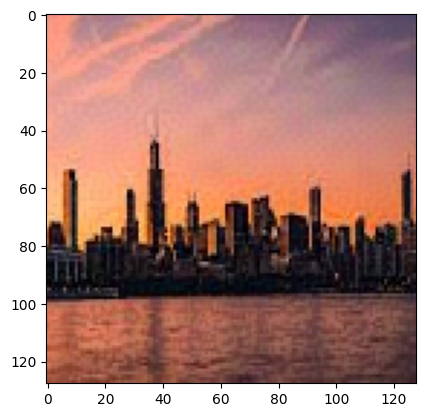

In [12]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.preprocessing import image as kp_image
from tensorflow.keras.models import Model
import numpy as np
import matplotlib.pyplot as plt

# Disable mixed precision
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('float32')  # Set the global policy to use float32 precision

# Helper function to load and preprocess images
def load_and_process_image(img_path):
    img = kp_image.load_img(img_path, target_size=(128, 128))  # Use smaller image sizes to fit within RAM
    img = kp_image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img, dtype=tf.float32)  # Ensure it's float32

# Function to de-process the image for viewing
def deprocess_img(processed_img):
    x = processed_img.copy()
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Function to compute content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

# Function to compute gram matrix for style loss
def gram_matrix(input_tensor):
    input_tensor = tf.cast(input_tensor, tf.float32)  # Ensure the tensor is in float32
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)

# Function to compute style loss
def compute_style_loss(base_style, gram_target):
    base_style = tf.cast(base_style, tf.float32)  # Ensure the tensor is in float32
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

# Function to compute total loss
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    style_weight, content_weight = loss_weights

    # Feed the input image through the VGG19 model
    model_outputs = model(tf.cast(init_image, tf.float32))  # Ensure input image is float32

    # Separate style and content outputs
    style_output_features = model_outputs[:len(gram_style_features)]
    content_output_features = model_outputs[len(gram_style_features):]

    # Compute style loss
    style_score = 0
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += compute_style_loss(comb_style[0], target_style)

    # Compute content loss
    content_score = compute_content_loss(content_output_features[0][0], content_features[0])

    # Total loss is the weighted sum of style and content loss
    style_score *= style_weight
    content_score *= content_weight
    loss = style_score + content_score
    return loss

# Function to compute gradients
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    return tape.gradient(loss, init_image), loss

# Build the model using selected layers from VGG19
def get_model():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    # Define content and style layers
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1']  # Reduced to two key style layers

    style_outputs = [vgg.get_layer(name).output for name in style_layers]
    content_outputs = [vgg.get_layer(name).output for name in content_layers]
    model_outputs = style_outputs + content_outputs

    return Model(vgg.input, model_outputs)

# Load images
content_image_path = '/content/is.jpeg'
style_image_path = '/content/is1.webp'

content_image = load_and_process_image(content_image_path)
style_image = load_and_process_image(style_image_path)

# Initialize the generated image as the content image
init_image = tf.Variable(content_image, dtype=tf.float32)

# Extract features from the style and content images
model = get_model()

# Get style and content features from the pre-trained VGG19 model
style_features = [style_layer[0] for style_layer in model(style_image)[:2]]
content_features = [content_layer[0] for content_layer in model(content_image)[2:]]

# Compute the gram matrices for the style features
gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

# Define the loss weights (adjustable)
style_weight = 1e-2
content_weight = 1e4
loss_weights = (style_weight, content_weight)

# Define the optimizer
opt = tf.optimizers.Adam(learning_rate=0.02)

# Training loop
num_iterations = 200  # Reduced number of iterations
for i in range(num_iterations):
    grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
    opt.apply_gradients([(grads, init_image)])  # All gradients are in float32
    if i % 50 == 0:
        print(f"Iteration {i}, Loss: {loss.numpy()}")

# De-process and display the result
best_img = deprocess_img(init_image.numpy()[0])
plt.imshow(best_img)
plt.show()


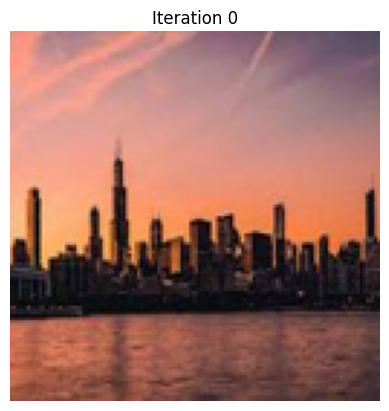

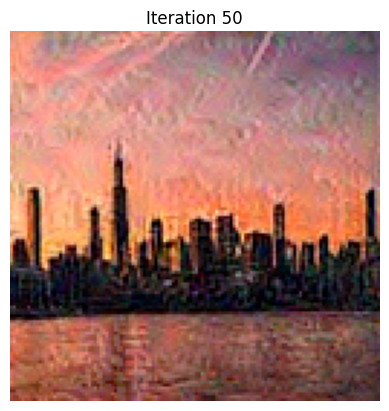

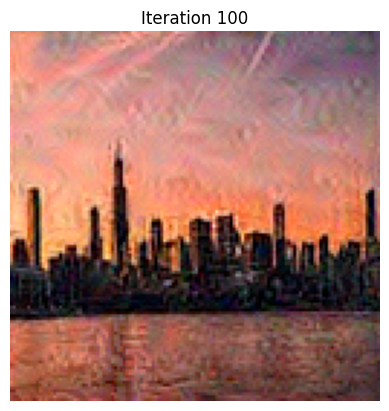

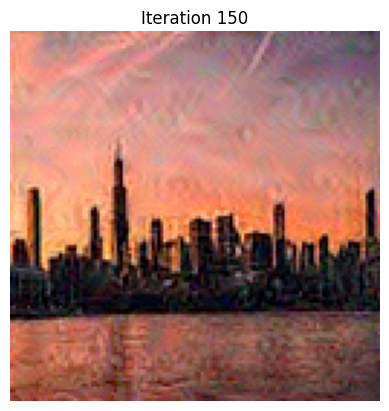

In [13]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load and preprocess images
def load_and_process_image(image_path, target_size=(128, 128)):
    img = Image.open(image_path).resize(target_size)
    img = np.array(img) / 255.0
    img = np.expand_dims(img, axis=0)
    return tf.convert_to_tensor(img)

def deprocess_img(img):
    img = img.numpy().squeeze()
    img = np.clip(img * 255, 0, 255).astype('uint8')
    return img

# Load VGG19 model for style transfer
def get_model():
    vgg = keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
    content_layers = ['block5_conv2']
    model = keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(name).output for name in style_layers + content_layers])
    return model

# Compute the Gram matrix
def gram_matrix(tensor):
    batch_size, height, width, channels = tensor.shape
    features = tf.reshape(tensor, (batch_size, height * width, channels))
    gram = tf.matmul(features, features, transpose_a=True)
    return gram / tf.cast(height * width * channels, tf.float32)

# Compute losses
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)
    style_outputs = model_outputs[:-1]
    content_output = model_outputs[-1]

    style_weight, content_weight = loss_weights
    style_loss = tf.add_n([compute_style_loss(style_outputs[i], gram_style_features[i]) for i in range(len(style_outputs))])
    style_loss *= style_weight / len(style_outputs)

    content_loss = compute_content_loss(content_output, content_features[0])
    content_loss *= content_weight

    total_loss = style_loss + content_loss
    return total_loss

@tf.function()
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Neural Style Transfer Function
def neural_style_transfer(content_image_path, style_image_path, num_iterations=200):
    content_image = load_and_process_image(content_image_path)
    style_image = load_and_process_image(style_image_path)
    init_image = tf.Variable(content_image)

    model = get_model()
    content_features = model(content_image)[-1:]
    style_features = model(style_image)[:-1]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    # Define loss weights
    style_weight = 1e-2
    content_weight = 1e4
    loss_weights = (style_weight, content_weight)

    # Optimizer
    opt = keras.optimizers.Adam(learning_rate=0.02)

    # Style Transfer
    for i in range(num_iterations):
        grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
        opt.apply_gradients([(grads, init_image)])

        if i % 50 == 0:
            intermediate_img = deprocess_img(init_image)
            plt.imshow(intermediate_img)
            plt.title(f"Iteration {i}")
            plt.axis('off')
            plt.show()

    best_img = deprocess_img(init_image)
    return best_img

# Paths to your content and style images
content_image_path = '/content/is.jpeg'  # Replace with your content image path
style_image_path = '/content/is1.webp'        # Replace with your style image path

# Run the style transfer
best_img = neural_style_transfer(content_image_path, style_image_path, num_iterations=200)

# Save the output image
result_image = Image.fromarray(best_img)
result_image.save('/content/style_transfer_result.jpg')


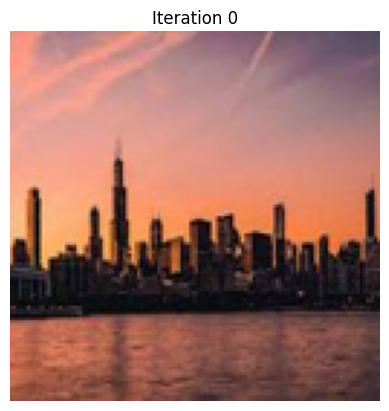

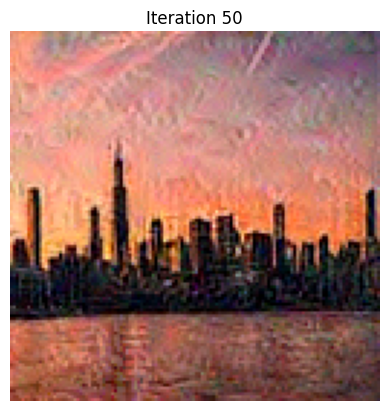

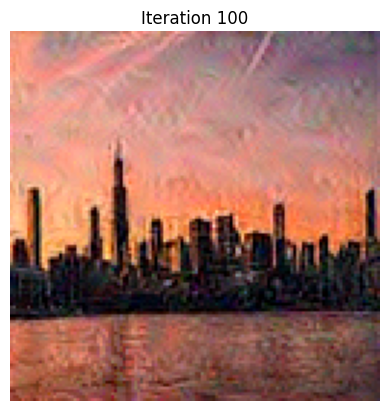

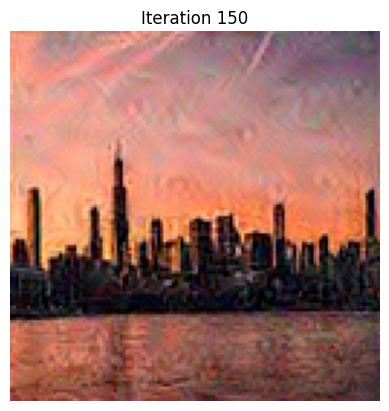

Result image saved at: /content/style_transfer_result.jpg


In [14]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# Load and preprocess images
def load_and_process_image(image_path, target_size=(128, 128)):
    try:
        img = Image.open(image_path).resize(target_size)
        img = np.array(img) / 255.0
        img = np.expand_dims(img, axis=0)
        return tf.convert_to_tensor(img)
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def deprocess_img(img):
    img = img.numpy().squeeze()
    img = np.clip(img * 255, 0, 255).astype('uint8')
    return img

# Load VGG19 model for style transfer
def get_model(style_layers, content_layers):
    vgg = keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    layers = style_layers + content_layers
    model = keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(name).output for name in layers])
    return model

# Compute the Gram matrix
def gram_matrix(tensor):
    batch_size, height, width, channels = tensor.shape
    features = tf.reshape(tensor, (batch_size, height * width, channels))
    gram = tf.matmul(features, features, transpose_a=True)
    return gram / tf.cast(height * width * channels, tf.float32)

# Compute losses
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)
    style_outputs = model_outputs[:-1]
    content_output = model_outputs[-1]

    style_weight, content_weight = loss_weights
    style_loss = tf.add_n([compute_style_loss(style_outputs[i], gram_style_features[i]) for i in range(len(style_outputs))])
    style_loss *= style_weight / len(style_outputs)

    content_loss = compute_content_loss(content_output, content_features[0])
    content_loss *= content_weight

    total_loss = style_loss + content_loss
    return total_loss

@tf.function()
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Neural Style Transfer Function
def neural_style_transfer(content_image_path, style_image_path, num_iterations=200, display_freq=50):
    content_image = load_and_process_image(content_image_path)
    style_image = load_and_process_image(style_image_path)

    if content_image is None or style_image is None:
        return None

    init_image = tf.Variable(content_image)

    # Specify layers to use for style and content
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
    content_layers = ['block5_conv2']
    model = get_model(style_layers, content_layers)

    content_features = model(content_image)[-1:]
    style_features = model(style_image)[:-1]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    # Define loss weights (adjustable)
    style_weight = 1e-2
    content_weight = 1e4
    loss_weights = (style_weight, content_weight)

    # Optimizer
    opt = keras.optimizers.Adam(learning_rate=0.02)

    # Style Transfer
    for i in range(num_iterations):
        grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
        opt.apply_gradients([(grads, init_image)])

        # Display intermediate results
        if i % display_freq == 0:
            intermediate_img = deprocess_img(init_image)
            plt.imshow(intermediate_img)
            plt.title(f"Iteration {i}")
            plt.axis('off')
            plt.show()

    best_img = deprocess_img(init_image)
    return best_img

# Paths to your content and style images
content_image_path = '/content/is.jpeg' # Replace with your content image path
style_image_path = '/content/is1.webp'        # Replace with your style image path

# Run the style transfer
best_img = neural_style_transfer(content_image_path, style_image_path, num_iterations=200, display_freq=50)

# Save the output image
if best_img is not None:
    result_image = Image.fromarray(best_img)
    result_image_path = '/content/style_transfer_result.jpg'
    result_image.save(result_image_path)
    print(f"Result image saved at: {result_image_path}")
else:
    print("Style transfer failed.")


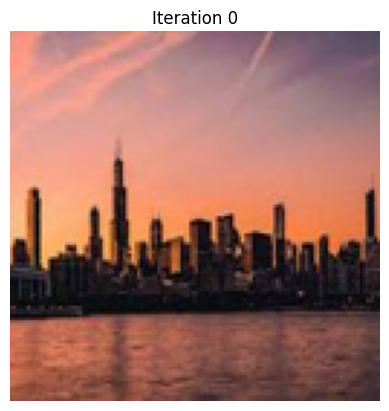

Intermediate image saved at: ./results/intermediate_0.jpg


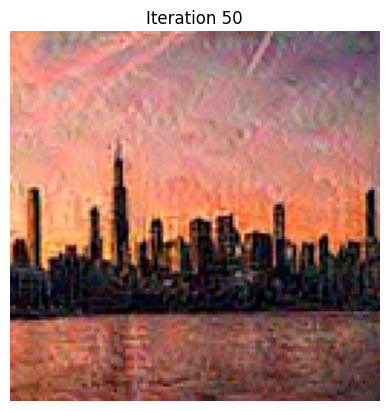

Intermediate image saved at: ./results/intermediate_50.jpg


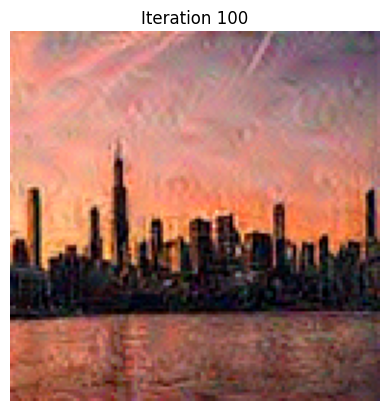

Intermediate image saved at: ./results/intermediate_100.jpg


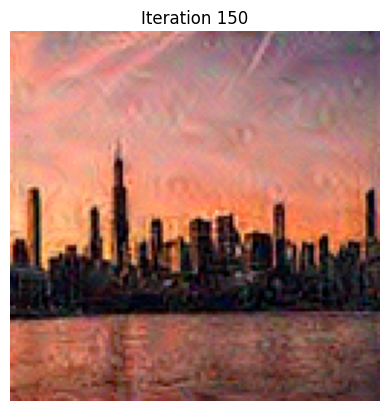

Intermediate image saved at: ./results/intermediate_150.jpg
Result image saved at: /content/style_transfer_result.jpg


In [15]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# Load and preprocess images
def load_and_process_image(image_path, target_size=(128, 128)):
    try:
        img = Image.open(image_path).resize(target_size)
        img = np.array(img) / 255.0
        img = np.expand_dims(img, axis=0)
        return tf.convert_to_tensor(img)
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def deprocess_img(img):
    img = img.numpy().squeeze()
    img = np.clip(img * 255, 0, 255).astype('uint8')
    return img

# Load VGG19 model for style transfer
def get_model(style_layers, content_layers):
    vgg = keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    layers = style_layers + content_layers
    model = keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(name).output for name in layers])
    return model

# Compute the Gram matrix
def gram_matrix(tensor):
    batch_size, height, width, channels = tensor.shape
    features = tf.reshape(tensor, (batch_size, height * width, channels))
    gram = tf.matmul(features, features, transpose_a=True)
    return gram / tf.cast(height * width * channels, tf.float32)

# Compute losses
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)
    style_outputs = model_outputs[:-1]
    content_output = model_outputs[-1]

    style_weight, content_weight = loss_weights
    style_loss = tf.add_n([compute_style_loss(style_outputs[i], gram_style_features[i]) for i in range(len(style_outputs))])
    style_loss *= style_weight / len(style_outputs)

    content_loss = compute_content_loss(content_output, content_features[0])
    content_loss *= content_weight

    total_loss = style_loss + content_loss
    return total_loss

@tf.function()
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Neural Style Transfer Function
def neural_style_transfer(content_image_path, style_image_path, num_iterations=200, display_freq=50, output_dir='./results', style_weight=1e-2, content_weight=1e4):
    os.makedirs(output_dir, exist_ok=True)  # Create output directory if it doesn't exist

    content_image = load_and_process_image(content_image_path)
    style_image = load_and_process_image(style_image_path)

    if content_image is None or style_image is None:
        return None

    init_image = tf.Variable(content_image)

    # Specify layers to use for style and content
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
    content_layers = ['block5_conv2']
    model = get_model(style_layers, content_layers)

    content_features = model(content_image)[-1:]
    style_features = model(style_image)[:-1]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    # Define loss weights
    loss_weights = (style_weight, content_weight)

    # Optimizer
    opt = keras.optimizers.Adam(learning_rate=0.02)

    # Style Transfer
    for i in range(num_iterations):
        grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
        opt.apply_gradients([(grads, init_image)])

        # Display and save intermediate results
        if i % display_freq == 0:
            intermediate_img = deprocess_img(init_image)
            plt.imshow(intermediate_img)
            plt.title(f"Iteration {i}")
            plt.axis('off')
            plt.show()

            # Save intermediate image
            intermediate_image_path = os.path.join(output_dir, f'intermediate_{i}.jpg')
            Image.fromarray(intermediate_img).save(intermediate_image_path)
            print(f"Intermediate image saved at: {intermediate_image_path}")

    best_img = deprocess_img(init_image)
    return best_img

# Paths to your content and style images
content_image_path = '/content/is.jpeg'  # Replace with your content image path
style_image_path = '/content/is1.webp'        # Replace with your style image path

# Run the style transfer
best_img = neural_style_transfer(content_image_path, style_image_path, num_iterations=200, display_freq=50)

# Save the output image
if best_img is not None:
    result_image = Image.fromarray(best_img)
    result_image_path = '/content/style_transfer_result.jpg'
    result_image.save(result_image_path)
    print(f"Result image saved at: {result_image_path}")
else:
    print("Style transfer failed.")


Running style transfer:   0%|          | 0/200 [00:00<?, ?it/s]

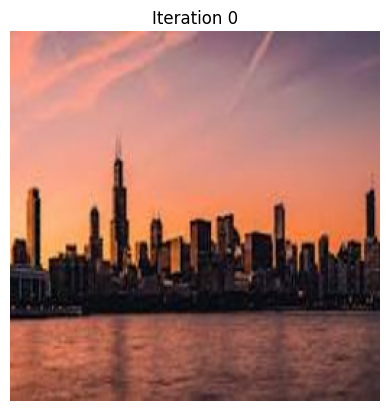

Running style transfer:  24%|██▍       | 48/200 [00:03<00:05, 30.33it/s]

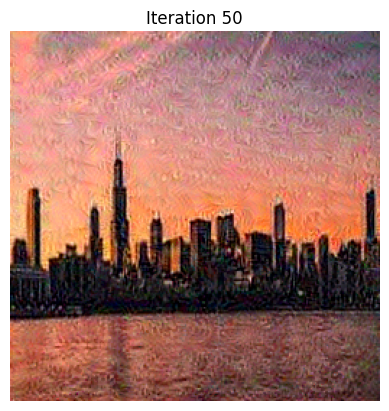

Running style transfer:  48%|████▊     | 97/200 [00:05<00:03, 33.84it/s]

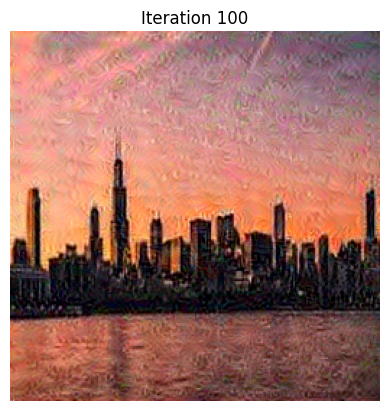

Running style transfer:  74%|███████▎  | 147/200 [00:07<00:01, 33.80it/s]

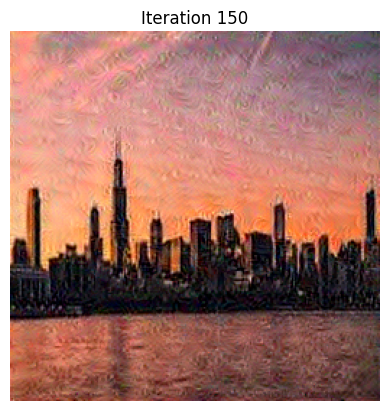

Running style transfer: 100%|██████████| 200/200 [00:08<00:00, 22.61it/s]


In [17]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from tqdm import tqdm  # Progress bar
import logging

# Set up logging
logging.basicConfig(level=logging.INFO)

# Load and preprocess images
def load_and_process_image(image_path, target_size=(128, 128)):
    try:
        img = Image.open(image_path).resize(target_size)
        img = np.array(img) / 255.0
        img = np.expand_dims(img, axis=0)
        return tf.convert_to_tensor(img)
    except Exception as e:
        logging.error(f"Error loading image {image_path}: {e}")
        return None

def deprocess_img(img):
    img = img.numpy().squeeze()
    img = np.clip(img * 255, 0, 255).astype('uint8')
    return img

# Load VGG19 model for style transfer
def get_model(style_layers, content_layers):
    vgg = keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    layers = style_layers + content_layers
    model = keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(name).output for name in layers])
    return model

# Compute the Gram matrix
def gram_matrix(tensor):
    batch_size, height, width, channels = tensor.shape
    features = tf.reshape(tensor, (batch_size, height * width, channels))
    gram = tf.matmul(features, features, transpose_a=True)
    return gram / tf.cast(height * width * channels, tf.float32)

# Compute losses
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)
    style_outputs = model_outputs[:-1]
    content_output = model_outputs[-1]

    style_weight, content_weight = loss_weights
    style_loss = tf.add_n([compute_style_loss(style_outputs[i], gram_style_features[i]) for i in range(len(style_outputs))])
    style_loss *= style_weight / len(style_outputs)

    content_loss = compute_content_loss(content_output, content_features[0])
    content_loss *= content_weight

    total_loss = style_loss + content_loss
    return total_loss

@tf.function()
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Neural Style Transfer Function
def neural_style_transfer(content_image_path, style_image_path, num_iterations=200, display_freq=50, output_dir='./results', style_weight=1e-2, content_weight=1e4, target_size=(128, 128)):
    os.makedirs(output_dir, exist_ok=True)  # Create output directory if it doesn't exist

    content_image = load_and_process_image(content_image_path, target_size)
    style_image = load_and_process_image(style_image_path, target_size)

    if content_image is None or style_image is None:
        return None

    init_image = tf.Variable(content_image)

    # Specify layers to use for style and content
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
    content_layers = ['block5_conv2']
    model = get_model(style_layers, content_layers)

    content_features = model(content_image)[-1:]
    style_features = model(style_image)[:-1]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    # Define loss weights
    loss_weights = (style_weight, content_weight)

    # Optimizer
    opt = keras.optimizers.Adam(learning_rate=0.02)

    # Style Transfer
    for i in tqdm(range(num_iterations), desc="Running style transfer"):
        grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
        opt.apply_gradients([(grads, init_image)])

        # Display and save intermediate results
        if i % display_freq == 0:
            intermediate_img = deprocess_img(init_image)
            plt.imshow(intermediate_img)
            plt.title(f"Iteration {i}")
            plt.axis('off')
            plt.show()

            # Save intermediate image
            intermediate_image_path = os.path.join(output_dir, f'intermediate_{i}.jpg')
            Image.fromarray(intermediate_img).save(intermediate_image_path)
            logging.info(f"Intermediate image saved at: {intermediate_image_path}")

    best_img = deprocess_img(init_image)
    return best_img

# Paths to your content and style images
content_image_path = '/content/is.jpeg'  # Replace with your content image path
style_image_path = '/content/is1.webp'        # Replace with your style image path

# Run the style transfer
best_img = neural_style_transfer(content_image_path, style_image_path, num_iterations=200, display_freq=50, target_size=(256, 256))

# Save the output image
if best_img is not None:
    result_image = Image.fromarray(best_img)
    result_image_path = '/content/style_transfer_result.jpg'
    result_image.save(result_image_path)
    logging.info(f"Result image saved at: {result_image_path}")
else:
    logging.error("Style transfer failed.")



Button(description='Run Style Transfer', style=ButtonStyle())

Processing is.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

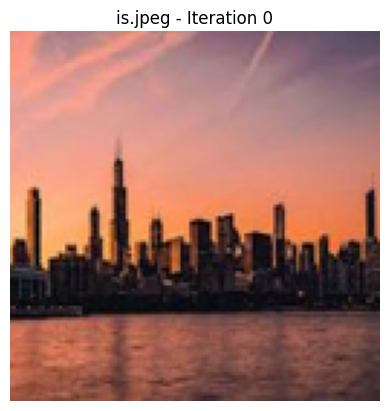

Processing is.jpeg:  24%|██▎       | 47/200 [00:01<00:02, 60.56it/s]

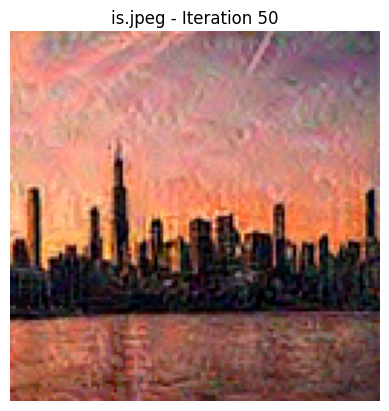

Processing is.jpeg:  46%|████▋     | 93/200 [00:02<00:01, 69.78it/s]

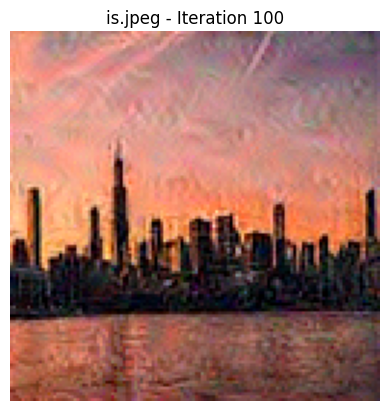

Processing is.jpeg:  72%|███████▎  | 145/200 [00:03<00:00, 68.74it/s]

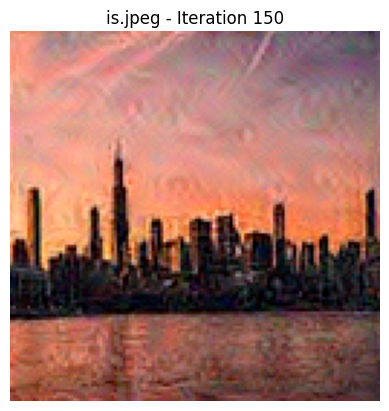

Processing is2.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

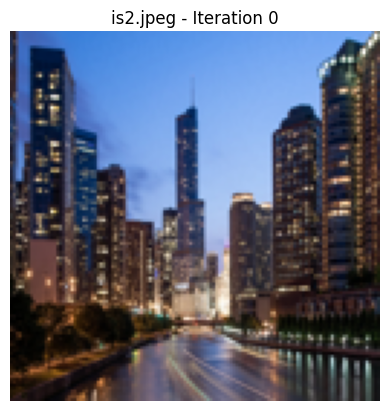

Processing is2.jpeg:  22%|██▎       | 45/200 [00:01<00:02, 64.48it/s]

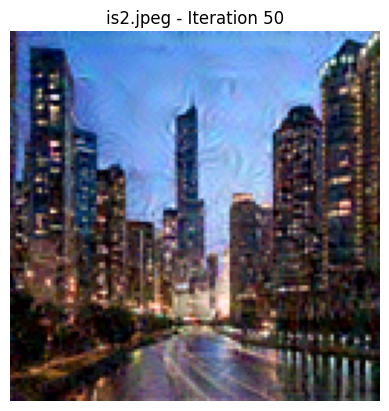

Processing is2.jpeg:  50%|████▉     | 99/200 [00:01<00:01, 81.30it/s]

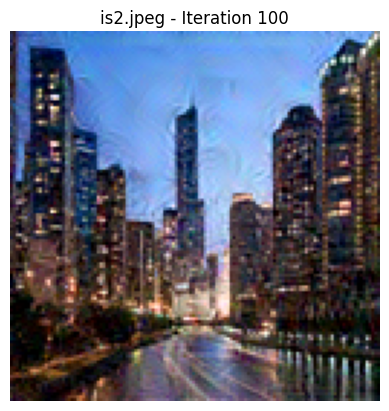

Processing is2.jpeg:  71%|███████   | 142/200 [00:02<00:00, 79.72it/s]

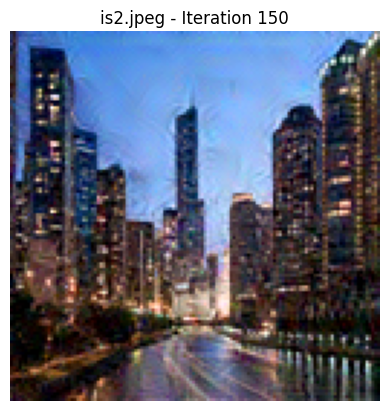

Processing is2.jpeg: 100%|██████████| 200/200 [00:03<00:00, 60.47it/s]


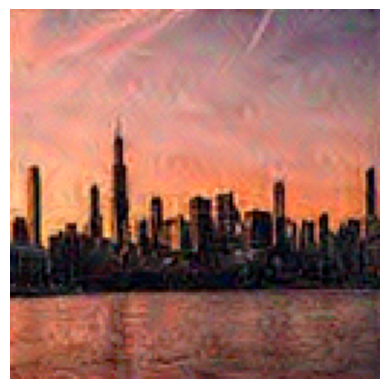

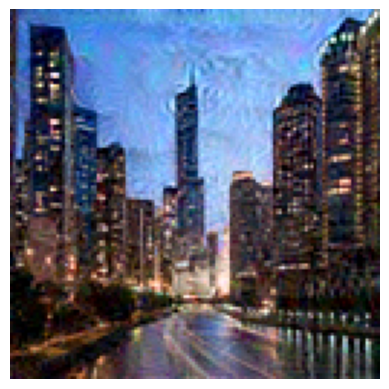

Processing is.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

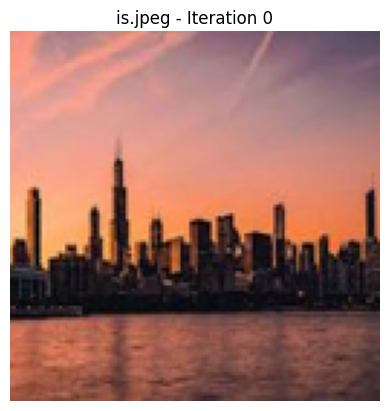

Processing is.jpeg:  22%|██▏       | 44/200 [00:01<00:02, 66.17it/s]

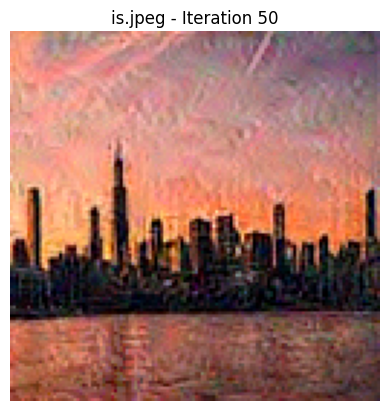

Processing is.jpeg:  50%|████▉     | 99/200 [00:01<00:01, 82.16it/s]

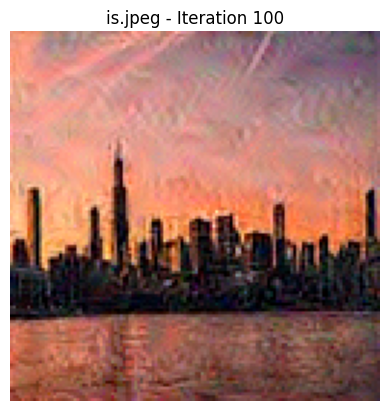

Processing is.jpeg:  71%|███████   | 142/200 [00:02<00:00, 75.73it/s]

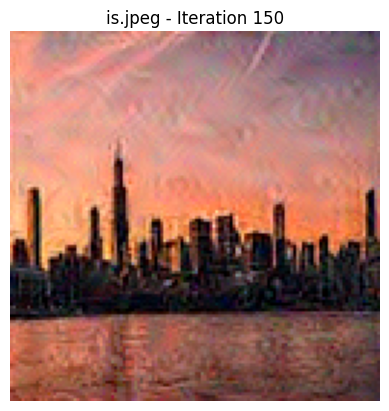

Processing is2.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

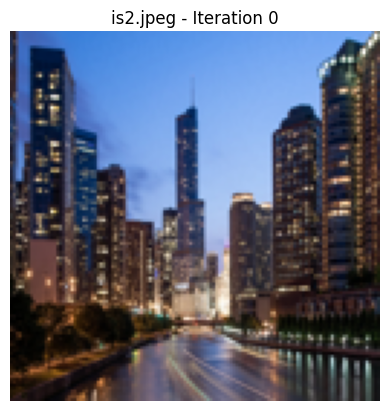

Processing is2.jpeg:  22%|██▏       | 43/200 [00:01<00:02, 53.10it/s]

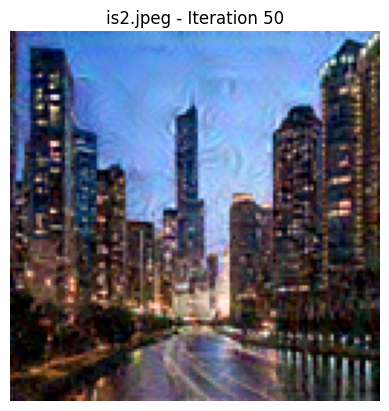

Processing is2.jpeg:  50%|█████     | 100/200 [00:02<00:02, 44.70it/s]

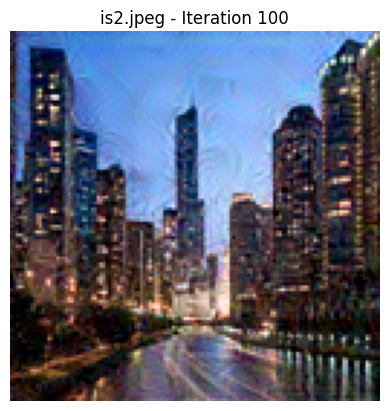

Processing is2.jpeg:  74%|███████▍  | 148/200 [00:04<00:01, 39.97it/s]

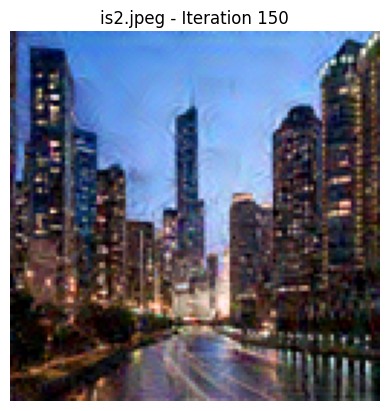

Processing is2.jpeg: 100%|██████████| 200/200 [00:05<00:00, 33.92it/s]


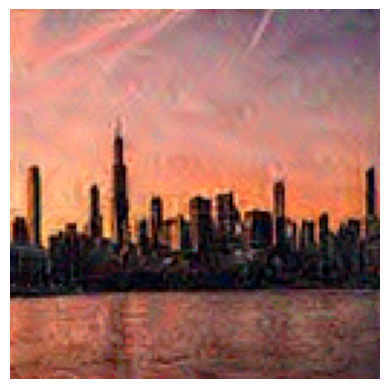

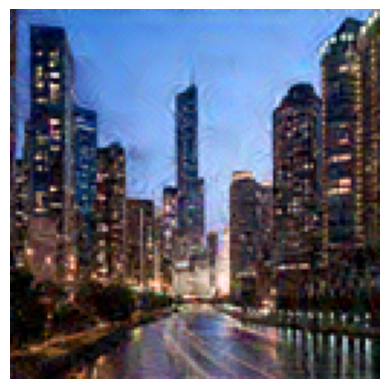

In [18]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from tqdm import tqdm
import logging
import ipywidgets as widgets  # For interactive widgets

# Set up logging
logging.basicConfig(level=logging.INFO)

# Load and preprocess images
def load_and_process_image(image_path, target_size=(128, 128)):
    try:
        img = Image.open(image_path).resize(target_size)
        img = np.array(img) / 255.0
        img = np.expand_dims(img, axis=0)
        return tf.convert_to_tensor(img)
    except Exception as e:
        logging.error(f"Error loading image {image_path}: {e}")
        return None

def deprocess_img(img):
    img = img.numpy().squeeze()
    img = np.clip(img * 255, 0, 255).astype('uint8')
    return img

# Load VGG19 model for style transfer
def get_model(style_layers, content_layers):
    vgg = keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    layers = style_layers + content_layers
    model = keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(name).output for name in layers])
    return model

# Compute the Gram matrix
def gram_matrix(tensor):
    batch_size, height, width, channels = tensor.shape
    features = tf.reshape(tensor, (batch_size, height * width, channels))
    gram = tf.matmul(features, features, transpose_a=True)
    return gram / tf.cast(height * width * channels, tf.float32)

# Compute losses
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)
    style_outputs = model_outputs[:-1]
    content_output = model_outputs[-1]

    style_weight, content_weight = loss_weights
    style_loss = tf.add_n([compute_style_loss(style_outputs[i], gram_style_features[i]) for i in range(len(style_outputs))])
    style_loss *= style_weight / len(style_outputs)

    content_loss = compute_content_loss(content_output, content_features[0])
    content_loss *= content_weight

    total_loss = style_loss + content_loss
    return total_loss

@tf.function()
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Batch processing of style transfer
def neural_style_transfer_batch(content_image_paths, style_image_path, num_iterations=200, display_freq=50, output_dir='./results', style_weight=1e-2, content_weight=1e4, target_size=(128, 128)):
    os.makedirs(output_dir, exist_ok=True)

    style_image = load_and_process_image(style_image_path, target_size)

    if style_image is None:
        return None

    best_images = []
    for content_image_path in content_image_paths:
        content_image = load_and_process_image(content_image_path, target_size)

        if content_image is None:
            continue

        init_image = tf.Variable(content_image)

        style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
        content_layers = ['block5_conv2']
        model = get_model(style_layers, content_layers)

        content_features = model(content_image)[-1:]
        style_features = model(style_image)[:-1]
        gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

        loss_weights = (style_weight, content_weight)
        opt = keras.optimizers.Adam(learning_rate=0.02)

        for i in tqdm(range(num_iterations), desc=f"Processing {os.path.basename(content_image_path)}"):
            grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
            opt.apply_gradients([(grads, init_image)])

            if i % display_freq == 0:
                intermediate_img = deprocess_img(init_image)
                plt.imshow(intermediate_img)
                plt.title(f"{os.path.basename(content_image_path)} - Iteration {i}")
                plt.axis('off')
                plt.show()

        best_img = deprocess_img(init_image)
        best_images.append(best_img)

        # Save the output image
        result_image_path = os.path.join(output_dir, f'style_transfer_{os.path.basename(content_image_path)}')
        Image.fromarray(best_img).save(result_image_path)
        logging.info(f"Result image saved at: {result_image_path}")

    return best_images

# Interactive widgets for parameter tuning
def interactive_style_transfer():
    content_images = ["/content/is.jpeg", "/content/is2.jpeg"]  # Update with your content images
    style_image = "/content/is1.webp"  # Update with your style image

    num_iterations = widgets.IntSlider(value=200, min=50, max=1000, step=50, description='Iterations')
    style_weight = widgets.FloatSlider(value=1e-2, min=0, max=1, step=0.01, description='Style Weight')
    content_weight = widgets.FloatSlider(value=1e4, min=0, max=1e5, step=1000, description='Content Weight')

    ui = widgets.VBox([num_iterations, style_weight, content_weight])

    def on_button_click(b):
        best_imgs = neural_style_transfer_batch(content_images, style_image, num_iterations=num_iterations.value, style_weight=style_weight.value, content_weight=content_weight.value)
        for img in best_imgs:
            plt.imshow(img)
            plt.axis('off')
            plt.show()

    button = widgets.Button(description="Run Style Transfer")
    button.on_click(on_button_click)

    display(ui, button)

# Run the interactive style transfer
interactive_style_transfer()


Button(description='Run Style Transfer', style=ButtonStyle())

Processing is.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

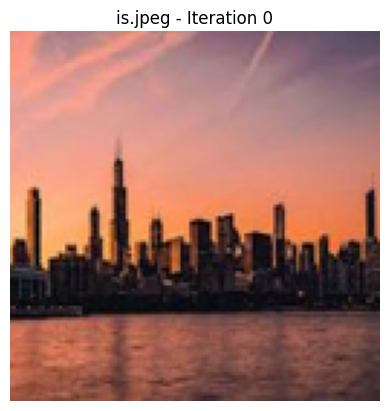

Processing is.jpeg:  24%|██▍       | 49/200 [00:02<00:03, 42.13it/s]

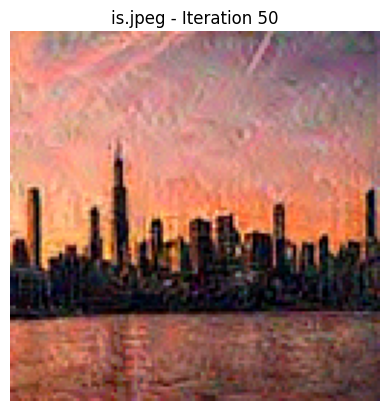

Processing is.jpeg:  48%|████▊     | 96/200 [00:03<00:01, 65.34it/s]

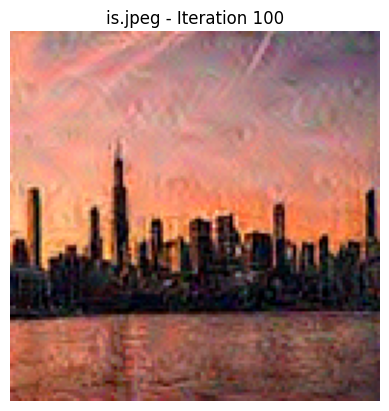

Processing is.jpeg:  74%|███████▍  | 148/200 [00:04<00:00, 72.08it/s]

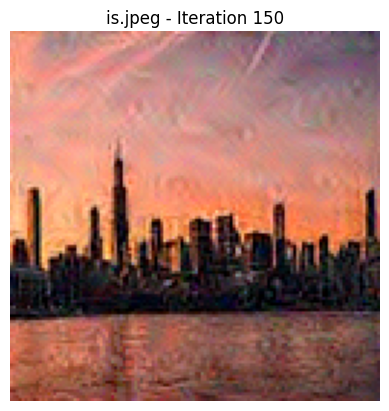

Processing is2.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

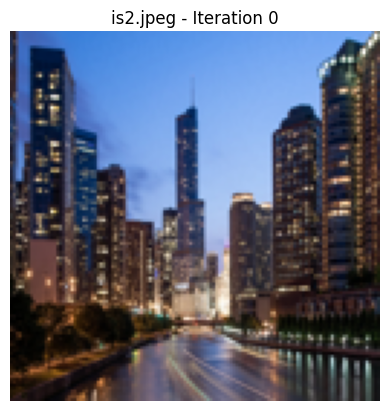

Processing is2.jpeg:  22%|██▎       | 45/200 [00:01<00:02, 57.22it/s]

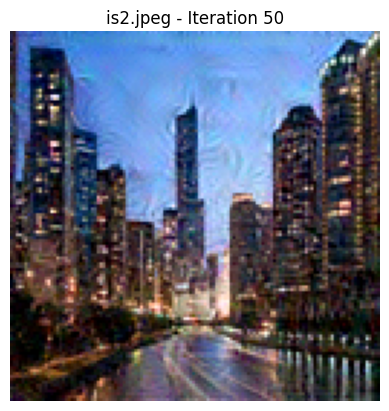

Processing is2.jpeg:  50%|████▉     | 99/200 [00:02<00:01, 79.48it/s]

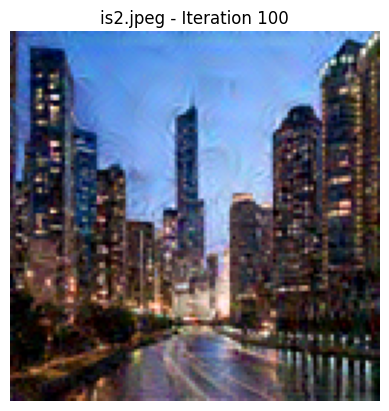

Processing is2.jpeg:  71%|███████   | 142/200 [00:02<00:00, 77.52it/s]

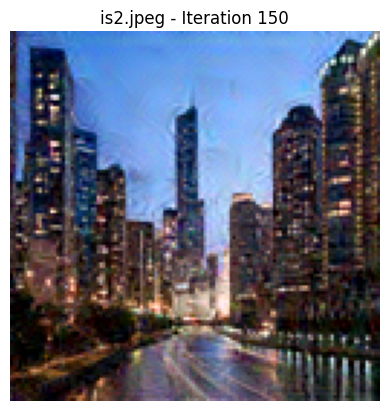

Processing is2.jpeg: 100%|██████████| 200/200 [00:03<00:00, 56.06it/s]


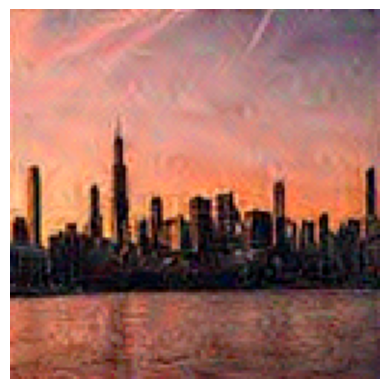

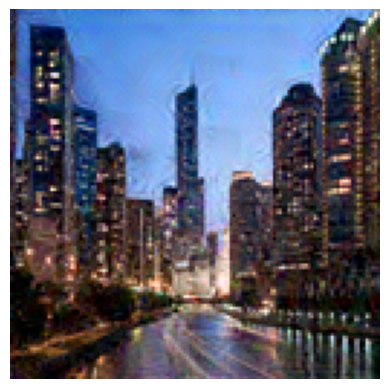

Processing is.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

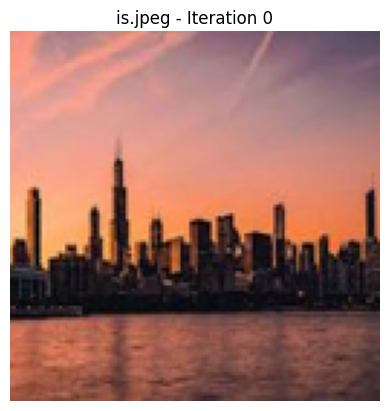

Processing is.jpeg:  22%|██▎       | 45/200 [00:01<00:02, 62.18it/s]

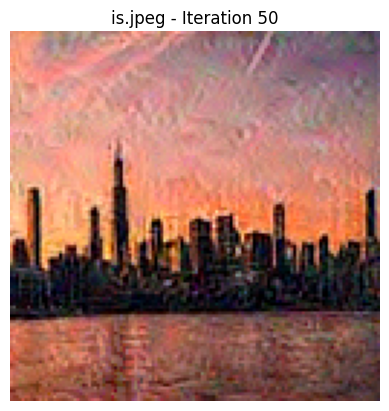

Processing is.jpeg:  46%|████▌     | 92/200 [00:01<00:01, 71.45it/s]

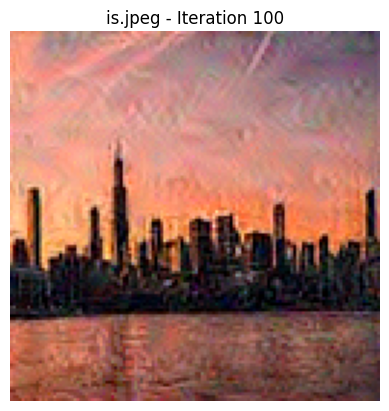

Processing is.jpeg:  72%|███████▎  | 145/200 [00:02<00:00, 72.17it/s]

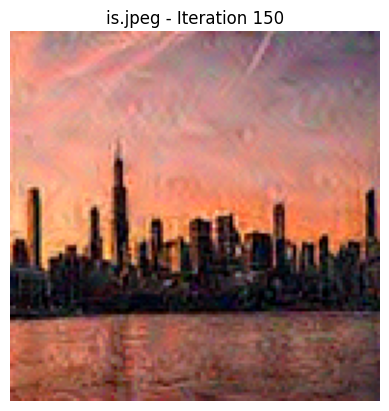

Processing is2.jpeg:   0%|          | 0/200 [00:00<?, ?it/s]

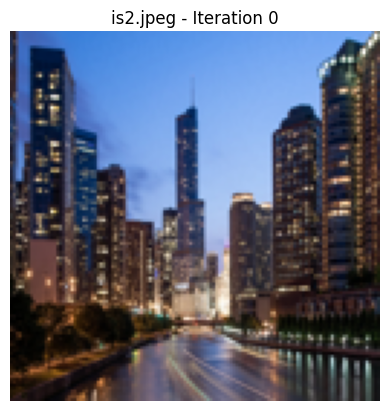

Processing is2.jpeg:  22%|██▎       | 45/200 [00:01<00:02, 65.58it/s]

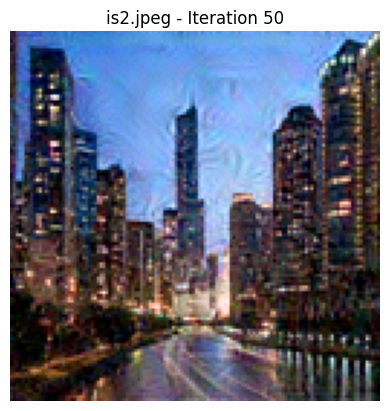

Processing is2.jpeg:  49%|████▉     | 98/200 [00:01<00:01, 82.21it/s]

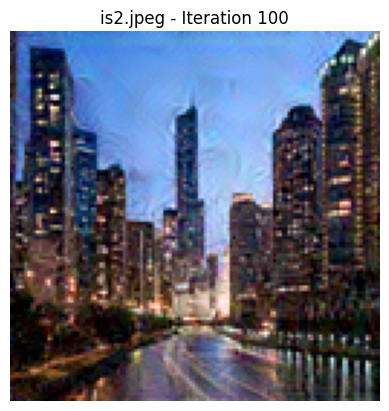

Processing is2.jpeg:  71%|███████   | 142/200 [00:02<00:00, 78.05it/s]

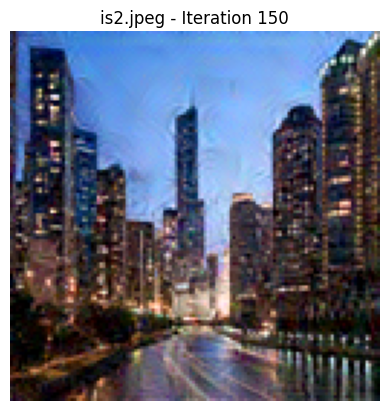

Processing is2.jpeg: 100%|██████████| 200/200 [00:03<00:00, 60.33it/s]


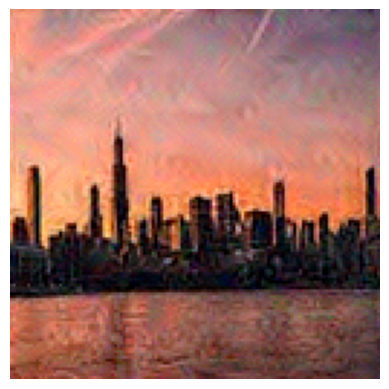

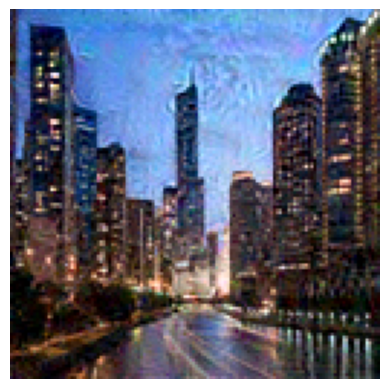

In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tqdm import tqdm
from PIL import Image
import logging
import ipywidgets as widgets

# Set up logging
logging.basicConfig(level=logging.INFO)

# Load and preprocess images
def load_and_process_image(image_path, target_size=(128, 128)):
    try:
        img = Image.open(image_path).resize(target_size)
        img = np.array(img) / 255.0
        img = np.expand_dims(img, axis=0)
        return tf.convert_to_tensor(img, dtype=tf.float32)
    except Exception as e:
        logging.error(f"Error loading image {image_path}: {e}")
        return None

def deprocess_img(img):
    img = img.numpy().squeeze()
    img = np.clip(img * 255, 0, 255).astype('uint8')
    return img

# Load VGG19 model for style transfer
def get_model(style_layers, content_layers):
    vgg = keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    layers = style_layers + content_layers
    model = keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(name).output for name in layers])
    return model

# Compute the Gram matrix
def gram_matrix(tensor):
    batch_size, height, width, channels = tensor.shape
    features = tf.reshape(tensor, (batch_size, height * width, channels))
    gram = tf.matmul(features, features, transpose_a=True)
    return gram / tf.cast(height * width * channels, tf.float32)

# Compute losses
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)
    style_outputs = model_outputs[:-1]
    content_output = model_outputs[-1]

    style_weight, content_weight = loss_weights
    style_loss = tf.add_n([compute_style_loss(style_outputs[i], gram_style_features[i]) for i in range(len(style_outputs))])
    style_loss *= style_weight / len(style_outputs)

    content_loss = compute_content_loss(content_output, content_features[0])
    content_loss *= content_weight

    total_loss = style_loss + content_loss
    return total_loss

@tf.function()
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Neural style transfer with progress saving
def neural_style_transfer_batch(content_image_paths, style_image_path, num_iterations=200, display_freq=50, output_dir='./results', style_weight=1e-2, content_weight=1e4, target_size=(128, 128)):
    os.makedirs(output_dir, exist_ok=True)

    style_image = load_and_process_image(style_image_path, target_size)

    if style_image is None:
        return None

    best_images = []
    for content_image_path in content_image_paths:
        content_image = load_and_process_image(content_image_path, target_size)

        if content_image is None:
            continue

        init_image = tf.Variable(content_image)

        style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
        content_layers = ['block5_conv2']
        model = get_model(style_layers, content_layers)

        content_features = model(content_image)[-1:]
        style_features = model(style_image)[:-1]
        gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

        loss_weights = (style_weight, content_weight)
        opt = keras.optimizers.Adam(learning_rate=0.02)

        for i in tqdm(range(num_iterations), desc=f"Processing {os.path.basename(content_image_path)}"):
            grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
            opt.apply_gradients([(grads, init_image)])

            # Save the intermediate results
            if i % display_freq == 0:
                intermediate_img = deprocess_img(init_image)
                plt.imshow(intermediate_img)
                plt.title(f"{os.path.basename(content_image_path)} - Iteration {i}")
                plt.axis('off')
                plt.show()

                # Save intermediate image
                intermediate_image_path = os.path.join(output_dir, f'intermediate_{i}_{os.path.basename(content_image_path)}')
                Image.fromarray(intermediate_img).save(intermediate_image_path)
                logging.info(f"Intermediate image saved at: {intermediate_image_path}")

        best_img = deprocess_img(init_image)
        best_images.append(best_img)

        # Save the final output image
        result_image_path = os.path.join(output_dir, f'style_transfer_{os.path.basename(content_image_path)}')
        Image.fromarray(best_img).save(result_image_path)
        logging.info(f"Result image saved at: {result_image_path}")

    return best_images

# Interactive widgets for parameter tuning
def interactive_style_transfer():
    content_images = ["/content/is.jpeg", "/content/is2.jpeg"]  # Update with your content images
    style_image = "/content/is1.webp"  # Update with your style image

    num_iterations = widgets.IntSlider(value=200, min=50, max=1000, step=50, description='Iterations')
    style_weight = widgets.FloatSlider(value=1e-2, min=0, max=1, step=0.01, description='Style Weight')
    content_weight = widgets.FloatSlider(value=1e4, min=0, max=1e5, step=1000, description='Content Weight')

    ui = widgets.VBox([num_iterations, style_weight, content_weight])

    def on_button_click(b):
        best_imgs = neural_style_transfer_batch(content_images, style_image, num_iterations=num_iterations.value, style_weight=style_weight.value, content_weight=content_weight.value)
        for img in best_imgs:
            plt.imshow(img)
            plt.axis('off')
            plt.show()

    button = widgets.Button(description="Run Style Transfer")
    button.on_click(on_button_click)

    display(ui, button)

# Run the interactive style transfer
interactive_style_transfer()


In [39]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tqdm import tqdm
from PIL import Image
import logging
import ipywidgets as widgets

# Set up logging
logging.basicConfig(level=logging.INFO)

# Load and preprocess images
def load_and_process_image(image_path, target_size=(128, 128)):
    try:
        img = Image.open(image_path).resize(target_size)
        img = np.array(img) / 255.0
        img = np.expand_dims(img, axis=0)
        return tf.convert_to_tensor(img, dtype=tf.float32)
    except Exception as e:
        logging.error(f"Error loading image {image_path}: {e}")
        return None

def deprocess_img(img):
    img = img.numpy().squeeze()
    img = np.clip(img * 255, 0, 255).astype('uint8')
    return img

# Load VGG19 model for style transfer
def get_model(style_layers, content_layers):
    vgg = keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    layers = style_layers + content_layers
    model = keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(name).output for name in layers])
    return model

# Compute the Gram matrix
def gram_matrix(tensor):
    batch_size, height, width, channels = tensor.shape
    features = tf.reshape(tensor, (batch_size, height * width, channels))
    gram = tf.matmul(features, features, transpose_a=True)
    return gram / tf.cast(height * width * channels, tf.float32)

# Compute losses
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    model_outputs = model(init_image)
    style_outputs = model_outputs[:-1]
    content_output = model_outputs[-1]

    style_weight, content_weight = loss_weights
    style_loss = tf.add_n([compute_style_loss(style_outputs[i], gram_style_features[i]) for i in range(len(style_outputs))])
    style_loss *= style_weight / len(style_outputs)

    content_loss = compute_content_loss(content_output, content_features[0])
    content_loss *= content_weight

    total_loss = style_loss + content_loss
    return total_loss

@tf.function()
def compute_grads(model, loss_weights, init_image, gram_style_features, content_features):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
    grads = tape.gradient(loss, init_image)
    return grads, loss

# Implement learning rate scheduler
def create_learning_rate_scheduler(initial_lr, decay_steps, decay_rate):
    return keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=initial_lr,
        decay_steps=decay_steps,
        decay_rate=decay_rate,
        staircase=True)

# Neural style transfer with progress saving and adaptive learning rate
def neural_style_transfer_batch(content_image_paths, style_image_path, num_iterations=200, display_freq=50, output_dir='./results', style_weight=1e-2, content_weight=1e4, target_size=(128, 128)):
    os.makedirs(output_dir, exist_ok=True)

    style_image = load_and_process_image(style_image_path, target_size)

    if style_image is None:
        return None

    best_images = []
    for content_image_path in content_image_paths:
        content_image = load_and_process_image(content_image_path, target_size)

        if content_image is None:
            continue

        init_image = tf.Variable(content_image)

        style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
        content_layers = ['block5_conv2']
        model = get_model(style_layers, content_layers)

        content_features = model(content_image)[-1:]
        style_features = model(style_image)[:-1]
        gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

        loss_weights = (style_weight, content_weight)

        # Create learning rate scheduler
        lr_schedule = create_learning_rate_scheduler(initial_lr=0.02, decay_steps=100, decay_rate=0.96)
        opt = keras.optimizers.Adam(learning_rate=lr_schedule)

        for i in tqdm(range(num_iterations), desc=f"Processing {os.path.basename(content_image_path)}"):
            grads, loss = compute_grads(model, loss_weights, init_image, gram_style_features, content_features)
            opt.apply_gradients([(grads, init_image)])

            # Save the intermediate results
            if i % display_freq == 0:
                intermediate_img = deprocess_img(init_image)
                plt.imshow(intermediate_img)
                plt.title(f"{os.path.basename(content_image_path)} - Iteration {i}")
                plt.axis('off')
                plt.show()

                # Save intermediate image
                intermediate_image_path = os.path.join(output_dir, f'intermediate_{i}_{os.path.basename(content_image_path)}')
                Image.fromarray(intermediate_img).save(intermediate_image_path)
                logging.info(f"Intermediate image saved at: {intermediate_image_path}")

        best_img = deprocess_img(init_image)
        best_images.append(best_img)

        # Save the final output image
        result_image_path = os.path.join(output_dir, f'style_transfer_{os.path.basename(content_image_path)}')
        Image.fromarray(best_img).save(result_image_path)
        logging.info(f"Result image saved at: {result_image_path}")

    return best_images

# Interactive widgets for parameter tuning
def interactive_style_transfer():
    content_images = ["/content/is.jpeg", "/content/is2.jpeg"]  # Update with your content images
    style_image = "/content/is1.webp"  # Update with your style image

    num_iterations = widgets.IntSlider(value=200, min=50, max=1000, step=50, description='Iterations')
    style_weight = widgets.FloatSlider(value=1e-2, min=0, max=1, step=0.01, description='Style Weight')
    content_weight = widgets.FloatSlider(value=1e4, min=0, max=1e5, step=1000, description='Content Weight')

    ui = widgets.VBox([num_iterations, style_weight, content_weight])

    def on_button_click(b):
        best_imgs = neural_style_transfer_batch(content_images, style_image, num_iterations=num_iterations.value, style_weight=style_weight.value, content_weight=content_weight.value)
        for img in best_imgs:
            plt.imshow(img)
            plt.axis('off')
            plt.show()

    button = widgets.Button(description="Run Style Transfer")
    button.on_click(on_button_click)

    display(ui, button)

# Run the interactive style transfer
interactive_style_transfer()


Button(description='Run Style Transfer', style=ButtonStyle())